In [50]:
import pandas as pd
import pickle
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [51]:
%%time
june = pd.read_pickle('../data/june_trips.pkl')

Wall time: 607 ms


In [52]:
june.head()
june.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 196197 entries, 0 to 205626
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype          
---  ------               --------------   -----          
 0   pubTimeStamp         196197 non-null  object         
 1   companyName          196197 non-null  object         
 2   tripRecordNum        196197 non-null  object         
 3   sumdID               196197 non-null  object         
 4   tripDistance         196197 non-null  float64        
 5   startLatitude        196197 non-null  float64        
 6   startLongitude       196197 non-null  float64        
 7   endLatitude          196197 non-null  float64        
 8   endLongitude         196197 non-null  float64        
 9   tripRoute            196197 non-null  object         
 10  create_dt            196197 non-null  object         
 11  startDateTime_clean  196197 non-null  datetime64[ns] 
 12  endDateTime_clean    196197 non-null  datetime64[ns] 
 13 

In [53]:
june.head()

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,tripRoute,create_dt,startDateTime_clean,endDateTime_clean,duration_clean,duration_min
0,2019-06-01 00:05:46.817000,Bird,BRD3572,PoweredSPI1T,328.084000,36.164400,-86.78070,36.163600,-86.780200,"[[36.164679,-86.781089],[36.163693,-86.78011],...",2019-06-02 05:30:19.960000,2019-06-01 00:02:18.203333,2019-06-01 00:06:16.406666,0 days 00:03:58.203333,3.966667
1,2019-06-01 00:05:46.817000,Bird,BRD3571,Powered2I3MS,4921.260000,36.175300,-86.79430,36.175300,-86.794300,"[[36.175367,-86.794232],[36.175367,-86.794232]...",2019-06-02 05:30:19.927000,2019-06-01 00:02:44.803333,2019-06-01 00:07:28.286666,0 days 00:04:43.483333,4.716667
2,2019-06-01 00:09:54,Gotcha,GOT1,Powered327,12.426575,36.161501,-86.77601,36.152529,-86.783742,"[[""36.16149"",""-86.77605000000001""]]",2019-06-06 22:23:08.673000,2019-06-01 00:09:56.000000,2019-06-01 00:21:56.000000,0 days 00:12:00,12.000000
3,2019-06-01 00:10:46.957000,Bird,BRD3610,Powered8U1A6,0.000000,36.164000,-86.78070,36.163100,-86.779700,"[[36.163168,-86.779639]]",2019-06-02 05:30:20.283000,2019-06-01 00:10:31.163333,2019-06-01 00:12:02.773333,0 days 00:01:31.610000,1.516667
4,2019-06-01 00:10:46.957000,Bird,BRD3612,PoweredSPI1T,656.168000,36.165000,-86.77990,36.165900,-86.777800,"[[36.164951,-86.779836],[36.16494,-86.779456],...",2019-06-02 05:30:20.347000,2019-06-01 00:07:21.430000,2019-06-01 00:12:30.913333,0 days 00:05:09.483333,5.150000


In [54]:
company_dict = {'Bird':0, 'Lyft': 1, 'Gotcha': 2, 'Lime': 3, 'Spin': 4, 'Jump': 5, 'Bolt': 6}

In [55]:
june.companyName = june.companyName.replace(company_dict)

In [56]:
june.pubTimeStamp = pd.to_datetime(june.pubTimeStamp)
june.head(2)

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,tripRoute,create_dt,startDateTime_clean,endDateTime_clean,duration_clean,duration_min
0,2019-06-01 00:05:46.817,0,BRD3572,PoweredSPI1T,328.084,36.1644,-86.7807,36.1636,-86.7802,"[[36.164679,-86.781089],[36.163693,-86.78011],...",2019-06-02 05:30:19.960000,2019-06-01 00:02:18.203333,2019-06-01 00:06:16.406666,0 days 00:03:58.203333,3.966667
1,2019-06-01 00:05:46.817,0,BRD3571,Powered2I3MS,4921.260,36.1753,-86.7943,36.1753,-86.7943,"[[36.175367,-86.794232],[36.175367,-86.794232]...",2019-06-02 05:30:19.927000,2019-06-01 00:02:44.803333,2019-06-01 00:07:28.286666,0 days 00:04:43.483333,4.716667


In [57]:
june.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 196197 entries, 0 to 205626
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype          
---  ------               --------------   -----          
 0   pubTimeStamp         196197 non-null  datetime64[ns] 
 1   companyName          196197 non-null  object         
 2   tripRecordNum        196197 non-null  object         
 3   sumdID               196197 non-null  object         
 4   tripDistance         196197 non-null  float64        
 5   startLatitude        196197 non-null  float64        
 6   startLongitude       196197 non-null  float64        
 7   endLatitude          196197 non-null  float64        
 8   endLongitude         196197 non-null  float64        
 9   tripRoute            196197 non-null  object         
 10  create_dt            196197 non-null  object         
 11  startDateTime_clean  196197 non-null  datetime64[ns] 
 12  endDateTime_clean    196197 non-null  datetime64[ns] 
 13 

In [58]:
june.drop(june.index[june['sumdID'] == 'PoweredUNKNOWN'], inplace = True)


In [59]:
june_vc = june['sumdID'].value_counts()

In [60]:
june_vc2 = june_vc < 30
june_vc2.head()

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    False
Powered5QBZSLFMLMLQU                           False
PoweredPC6QPCO4BH7O3                           False
PoweredSJTYATG4FVICD                           False
PoweredMDAQYMTPMLQL2                           False
Name: sumdID, dtype: bool

In [61]:
june_list = june_vc[june_vc2].index.to_list()

In [62]:
june_scooters = june.loc[june['sumdID'].isin(june_list)]

In [63]:
june_scooters = june

In [64]:
june_scooters.info()
june_scooters.head(5)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195077 entries, 0 to 205626
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype          
---  ------               --------------   -----          
 0   pubTimeStamp         195077 non-null  datetime64[ns] 
 1   companyName          195077 non-null  object         
 2   tripRecordNum        195077 non-null  object         
 3   sumdID               195077 non-null  object         
 4   tripDistance         195077 non-null  float64        
 5   startLatitude        195077 non-null  float64        
 6   startLongitude       195077 non-null  float64        
 7   endLatitude          195077 non-null  float64        
 8   endLongitude         195077 non-null  float64        
 9   tripRoute            195077 non-null  object         
 10  create_dt            195077 non-null  object         
 11  startDateTime_clean  195077 non-null  datetime64[ns] 
 12  endDateTime_clean    195077 non-null  datetime64[ns] 
 13 

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,tripRoute,create_dt,startDateTime_clean,endDateTime_clean,duration_clean,duration_min
0,2019-06-01 00:05:46.817,0,BRD3572,PoweredSPI1T,328.084000,36.164400,-86.78070,36.163600,-86.780200,"[[36.164679,-86.781089],[36.163693,-86.78011],...",2019-06-02 05:30:19.960000,2019-06-01 00:02:18.203333,2019-06-01 00:06:16.406666,0 days 00:03:58.203333,3.966667
1,2019-06-01 00:05:46.817,0,BRD3571,Powered2I3MS,4921.260000,36.175300,-86.79430,36.175300,-86.794300,"[[36.175367,-86.794232],[36.175367,-86.794232]...",2019-06-02 05:30:19.927000,2019-06-01 00:02:44.803333,2019-06-01 00:07:28.286666,0 days 00:04:43.483333,4.716667
2,2019-06-01 00:09:54.000,2,GOT1,Powered327,12.426575,36.161501,-86.77601,36.152529,-86.783742,"[[""36.16149"",""-86.77605000000001""]]",2019-06-06 22:23:08.673000,2019-06-01 00:09:56.000000,2019-06-01 00:21:56.000000,0 days 00:12:00,12.000000
3,2019-06-01 00:10:46.957,0,BRD3610,Powered8U1A6,0.000000,36.164000,-86.78070,36.163100,-86.779700,"[[36.163168,-86.779639]]",2019-06-02 05:30:20.283000,2019-06-01 00:10:31.163333,2019-06-01 00:12:02.773333,0 days 00:01:31.610000,1.516667
4,2019-06-01 00:10:46.957,0,BRD3612,PoweredSPI1T,656.168000,36.165000,-86.77990,36.165900,-86.777800,"[[36.164951,-86.779836],[36.16494,-86.779456],...",2019-06-02 05:30:20.347000,2019-06-01 00:07:21.430000,2019-06-01 00:12:30.913333,0 days 00:05:09.483333,5.150000


In [65]:
june_scooters = june_scooters[['pubTimeStamp', 'startLatitude', 'startLongitude', 'sumdID', 'companyName']]

In [66]:
june_scooters.info()
june_scooters.head(5)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195077 entries, 0 to 205626
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   pubTimeStamp    195077 non-null  datetime64[ns]
 1   startLatitude   195077 non-null  float64       
 2   startLongitude  195077 non-null  float64       
 3   sumdID          195077 non-null  object        
 4   companyName     195077 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 8.9+ MB


,pubTimeStamp,startLatitude,startLongitude,sumdID,companyName
0,2019-06-01 00:05:46.817,36.164400,-86.78070,PoweredSPI1T,0
1,2019-06-01 00:05:46.817,36.175300,-86.79430,Powered2I3MS,0
2,2019-06-01 00:09:54.000,36.161501,-86.77601,Powered327,2
3,2019-06-01 00:10:46.957,36.164000,-86.78070,Powered8U1A6,0
4,2019-06-01 00:10:46.957,36.165000,-86.77990,PoweredSPI1T,0


In [67]:
june_scooters.to_pickle("../data/june.pkl")

In [68]:
%%time
june_test = pd.read_pickle("../data/june.pkl")

Wall time: 38 ms


In [69]:
# june_scooters.shape

In [70]:
# june_scoot_count = june_scooters.sumdID.value_counts()

In [71]:
# print(june_scoot_count.head(20))

In [72]:
# print(june_scoot_count.tail(100))

In [73]:
zipcodes = gpd.read_file('../data/zipcodes.geojson')
print(zipcodes.crs)
zipcodes.head( )

epsg:4326


,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,18,FRANKLIN,28995.828320601937,46969608.005737305,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [74]:
type(zipcodes)

geopandas.geodataframe.GeoDataFrame

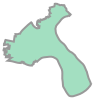

In [75]:
zipcodes.loc[0, 'geometry']

In [76]:
print(zipcodes.loc[0, 'geometry'])

MULTIPOLYGON (((-86.68724897141 36.318212121092, -86.687216475338 36.318210560887, -86.687181702435 36.318208780693, -86.68714696276101 36.318206917893, -86.68711218725601 36.318205000347, -86.687077445444 36.318202972151, -86.687042702928 36.318200862685, -86.68703469075101 36.318200362824, -86.687007959928 36.318198697129, -86.68697325063 36.318196422067, -86.686938539918 36.318194065167, -86.68690382778099 36.318191625285, -86.68686914958001 36.318189102792, -86.68683443743301 36.318186498074, -86.6867997571 36.318183810757, -86.686765111412 36.318181040826, -86.686730430357 36.318178188106, -86.686695782299 36.318175225883, -86.68666116771 36.318172208522, -86.686626552408 36.318169108746, -86.686591935688 36.318165926561, -86.68655731872499 36.318162634491, -86.686522735235 36.318159287854, -86.68648815149901 36.318155830759, -86.686453600524 36.318152318529, -86.68641904813001 36.31814872389, -86.68638449549 36.318145018792, -86.686349976324 36.318141259129, -86.68631549014999 36

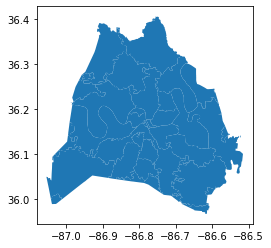

In [77]:
zipcodes.plot();

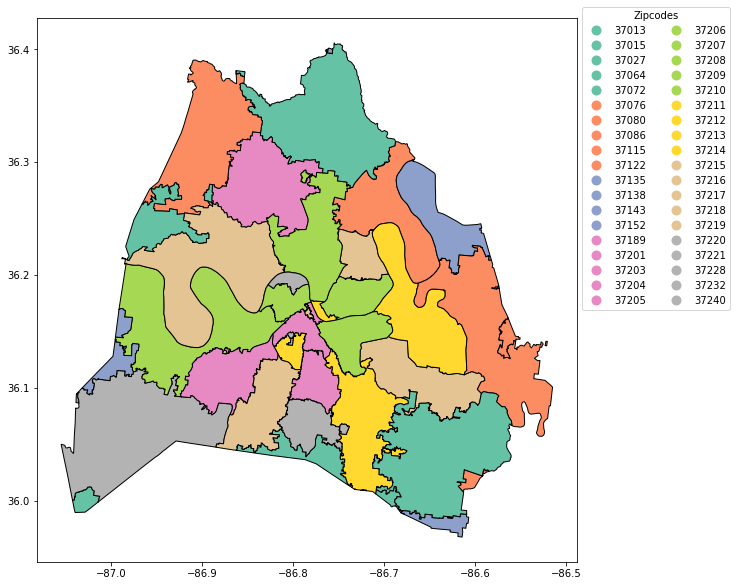

In [78]:
leg_kwds = {'title': 'Zipcodes', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

zipcodes.plot(column = 'zip', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [79]:
def make_point_geometry(startLatitude, startLongitude):
    return Point(startLongitude, startLatitude)

In [80]:
june_scooters['geometry'] = list(map(make_point_geometry, june_scooters['startLatitude'].values, june_scooters['startLongitude'].values))


<ipython-input-80-9cfd5f54ac95>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  june_scooters['geometry'] = list(map(make_point_geometry, june_scooters['startLatitude'].values, june_scooters['startLongitude'].values))


In [81]:
zipcodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [82]:
june_geo = gpd.GeoDataFrame(june_scooters, 
                           crs = zipcodes.crs, 
                           geometry = june_scooters['geometry'])

In [83]:
type(june_geo)

geopandas.geodataframe.GeoDataFrame

In [84]:
zipcodes = zipcodes[['zip', 'po_name', 'geometry']]

In [85]:
trips_by_zip = gpd.sjoin(june_geo, zipcodes, op = 'within')

In [86]:
trips_by_zip.head()

,pubTimeStamp,startLatitude,startLongitude,sumdID,companyName,geometry,index_right,zip,po_name
0,2019-06-01 00:05:46.817,36.16440,-86.780700,PoweredSPI1T,0,POINT (-86.78070 36.16440),24,37219,NASHVILLE
3,2019-06-01 00:10:46.957,36.16400,-86.780700,Powered8U1A6,0,POINT (-86.78070 36.16400),24,37219,NASHVILLE
4,2019-06-01 00:10:46.957,36.16500,-86.779900,PoweredSPI1T,0,POINT (-86.77990 36.16500),24,37219,NASHVILLE
22,2019-06-01 00:16:28.000,36.16375,-86.783152,Powered-fe10870b-b1b6-6156-2012-5bd5961d048c,Bolt Mobility,POINT (-86.78315 36.16375),24,37219,NASHVILLE
54,2019-06-01 00:25:47.827,36.17440,-86.786100,PoweredKYD6L,0,POINT (-86.78610 36.17440),24,37219,NASHVILLE


In [87]:
# trips_by_zip['zip'].value_counts()

In [88]:
# trips_in_37203 = trips_by_zip.loc[trips_by_zip['zip'] == '37203']
# trips_in_37203.shape

In [89]:
# polygon37203 = zipcodes.loc[zipcodes['zip'] == '37203']
# polygon37203.shape

In [90]:
#fig, ax = matplotlib.subplots()
# ax = polygon37203.plot(figsize = (8, 10), color = 'lightgreen')
# trips_in_37203.plot( ax = ax, column = 'zip');
# plt.show();

In [91]:
#polygon37203.geometry.centroid

In [92]:
#find the center of the larger (more southern) polygon and look at it
# center = polygon37203.geometry.centroid
# print(center)

In [93]:
# reverse the order when constructing the array for folium location
# area_center = [center.y, center.x]

# check the order of area_center, the location for our folium map
# print(area_center)

area_center = (36.186314,-87.0654347)


In [94]:
#create our map of Nashville Zip Code 37207 and show it
map_37203 = folium.Map(location =  area_center, zoom_start = 12)
map_37203

In [95]:
i = 0
for row_index, row_values in trips_by_zip.iterrows():
    if i <3: 
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 0
values are:
 
pubTimeStamp      2019-06-01 00:05:46.817000
startLatitude                        36.1644
startLongitude                      -86.7807
sumdID                          PoweredSPI1T
companyName                                0
geometry            POINT (-86.7807 36.1644)
index_right                               24
zip                                    37219
po_name                            NASHVILLE
Name: 0, dtype: object
------------------------- 
index is 3
values are:
 
pubTimeStamp      2019-06-01 00:10:46.957000
startLatitude                         36.164
startLongitude                      -86.7807
sumdID                          Powered8U1A6
companyName                                0
geometry             POINT (-86.7807 36.164)
index_right                               24
zip                                    37219
po_name                            NASHVILLE
Name: 3, dtype: object
------------------------- 
index is 4
values are:
 
pubTimeStamp   

In [ ]:
#draw our zip code area: 37203
map_37203 = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(zipcodes).add_to(map_37203)

for row_index, row_values in trips_by_zip.iterrows():
    loc = [row_values['startLatitude'], row_values['startLongitude']]
    pop = str(row_values['sumdID'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(map_37203)
map_37203.save('../maps/map37203.html')

#display our map
map_37203

In [ ]:
folium.Map?

In [96]:
cluster_map_37203_under30 = folium.Map(location =  area_center, zoom_start = 12)

#create a marker cluster
marker_cluster = MarkerCluster().add_to(cluster_map_37203_under30)

folium.GeoJson(zipcodes).add_to(cluster_map_37203_under30)

# inside the loop add each marker to the cluster
for row_index, row_values in trips_by_zip.iterrows():
    loc = [row_values['startLatitude'], row_values['startLongitude']]
    pop = str(row_values['sumdID'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)

In [ ]:
#save an interactive HTML map by calling .save()
cluster_map_37203_under30.save('../maps/cluster37203_under30.html')

#draw our zip code area: 37207
map_37203 = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(zipcodes).add_to(map_37203)

#create a list of locations and pass them to FastMarkerCluster()
locations = trips_by_zip[['startLatitude', 'startLongitude']].values.tolist()
map_37203.add_child(
    FastMarkerCluster(locations)
)

In [ ]:
#display our map
map_37203

cluster_map_37203